In [ ]:
# Cell 1: Install necessary libraries
!pip install tensorflow
!pip install keras
!pip install zipfile36


In [ ]:


# Cell 3: Upload the zip file containing your dataset
from google.colab import files
uploaded = files.upload()

# Unzip the uploaded file
import zipfile
import os

zip_file = list(uploaded.keys())[0]
with zipfile.ZipFile(zip_file, 'r') as zip_ref:
    zip_ref.extractall('/content/dataset')


Saving output.zip to output.zip


In [ ]:
# Cell 4: Import necessary libraries
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt


In [ ]:
# Cell 5: Prepare data generators
train_dir = '/content/dataset/output/train'
valid_dir = '/content/dataset/output/valid'
test_dir = '/content/dataset/output/test'

train_datagen = ImageDataGenerator(rescale=1./255)
valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)

valid_generator = valid_datagen.flow_from_directory(
    valid_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)


Found 16840 images belonging to 2 classes.
Found 5052 images belonging to 2 classes.
Found 1684 images belonging to 2 classes.


In [ ]:
# Cell 6: Build the CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer=Adam(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'])


In [ ]:
# Cell 7: Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=valid_generator,
    validation_steps=valid_generator.samples // valid_generator.batch_size,
    epochs=20
)


Epoch 1/20
526/526 [==============================] - 37s 57ms/step - loss: 0.4475 - accuracy: 0.7831 - val_loss: 0.2642 - val_accuracy: 0.8953
Epoch 2/20
526/526 [==============================] - 25s 47ms/step - loss: 0.2485 - accuracy: 0.9007 - val_loss: 0.1517 - val_accuracy: 0.9401
Epoch 3/20
526/526 [==============================] - 24s 46ms/step - loss: 0.1502 - accuracy: 0.9432 - val_loss: 0.1051 - val_accuracy: 0.9612
Epoch 4/20
526/526 [==============================] - 25s 48ms/step - loss: 0.1048 - accuracy: 0.9599 - val_loss: 0.0798 - val_accuracy: 0.9743
Epoch 5/20
526/526 [==============================] - 24s 46ms/step - loss: 0.0780 - accuracy: 0.9728 - val_loss: 0.0550 - val_accuracy: 0.9819
Epoch 6/20
526/526 [==============================] - 24s 46ms/step - loss: 0.0620 - accuracy: 0.9791 - val_loss: 0.0397 - val_accuracy: 0.9851
Epoch 7/20
526/526 [==============================] - 24s 46ms/step - loss: 0.0371 - accuracy: 0.9873 - val_loss: 0.0203 - val_accuracy:

In [ ]:
# Cell 8: Evaluate the model
loss, accuracy = model.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)
print(f'Test accuracy: {accuracy}')


52/52 [==============================] - 2s 29ms/step - loss: 0.0027 - accuracy: 0.9994
Test accuracy: 0.9993990659713745


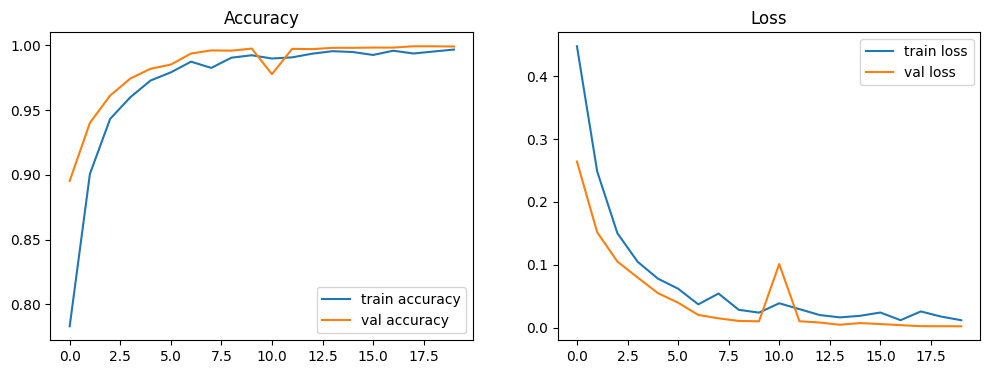

In [ ]:
# Cell 9: Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.title('Loss')
plt.legend()

plt.show()


In [ ]:
# Cell 10: Upload new images for prediction
from google.colab import files
uploaded_images = files.upload()

import numpy as np
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(150, 150))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0
    return img, img_array


Saving _114827006_4bcddd6d-99cc-407a-994d-eaea9e58387d_jpg.rf.e1fa73176719b27f214d51354a62e1c1_104_114.jpg to _114827006_4bcddd6d-99cc-407a-994d-eaea9e58387d_jpg.rf.e1fa73176719b27f214d51354a62e1c1_104_114.jpg
Saving _114827006_4bcddd6d-99cc-407a-994d-eaea9e58387d-1-_jpg.rf.76bacba026c28261598a588cf22a7873_179_97.jpg to _114827006_4bcddd6d-99cc-407a-994d-eaea9e58387d-1-_jpg.rf.76bacba026c28261598a588cf22a7873_179_97.jpg
Saving Wry-neck-credit-GD-768x1024-1-_webp.rf.f6191a83a23cfda5a09f7957a6b31d6e_24_204.jpg to Wry-neck-credit-GD-768x1024-1-_webp.rf.f6191a83a23cfda5a09f7957a6b31d6e_24_204.jpg
Saving videoplayback_mp4-0001_jpg.rf.066a4d2d72d8f3daf317aa0e61a193e3_226_160.jpg to videoplayback_mp4-0001_jpg.rf.066a4d2d72d8f3daf317aa0e61a193e3_226_160 (1).jpg
Saving videoplayback_mp4-0001_jpg.rf.066a4d2d72d8f3daf317aa0e61a193e3_305_6.jpg to videoplayback_mp4-0001_jpg.rf.066a4d2d72d8f3daf317aa0e61a193e3_305_6.jpg
Saving videoplayback_mp4-0002_jpg.rf.550e41e48c443a12f35a480215bfca5d_232_49.jpg

1/1 [==============================] - 0s 19ms/step


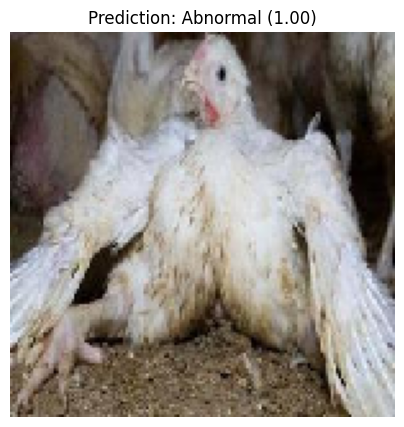

1/1 [==============================] - 0s 16ms/step


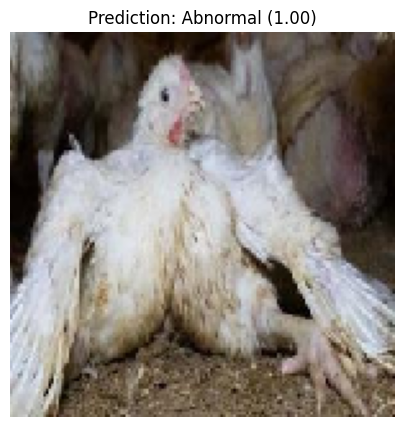

1/1 [==============================] - 0s 27ms/step


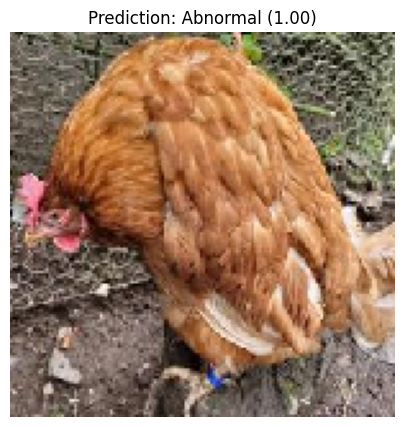

1/1 [==============================] - 0s 30ms/step


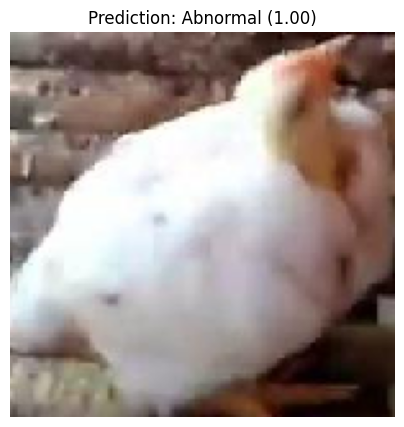

1/1 [==============================] - 0s 17ms/step


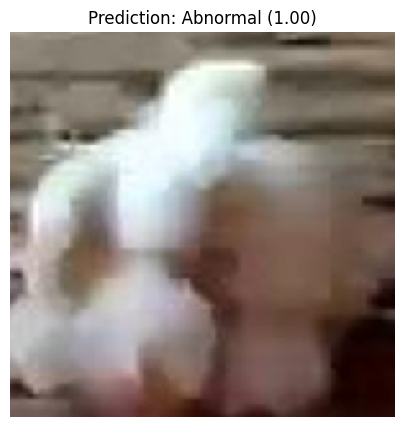

1/1 [==============================] - 0s 18ms/step


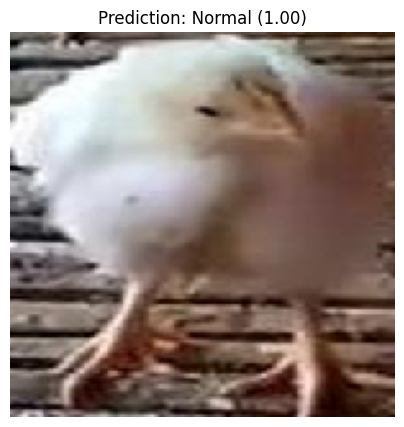

1/1 [==============================] - 0s 17ms/step


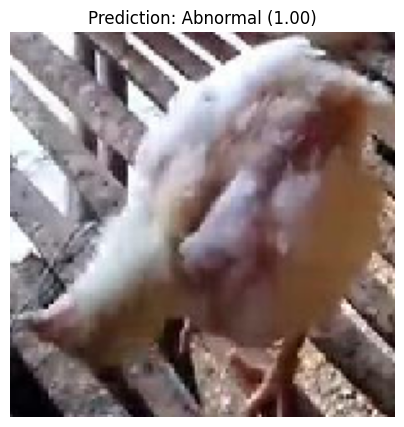

1/1 [==============================] - 0s 20ms/step


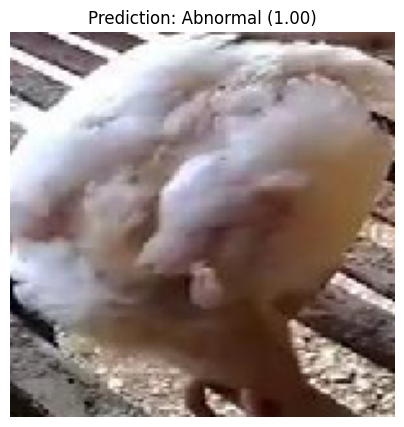

1/1 [==============================] - 0s 21ms/step


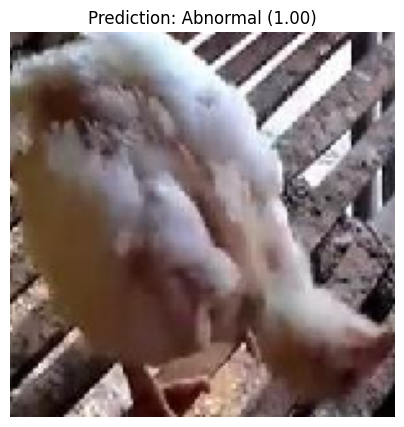

1/1 [==============================] - 0s 31ms/step


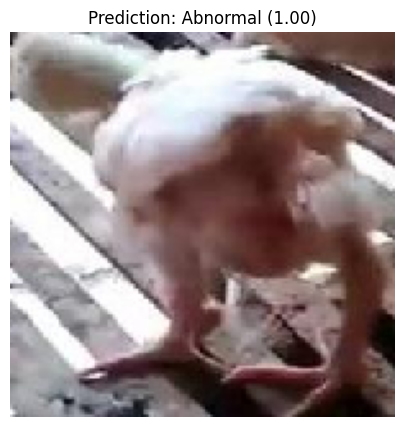

1/1 [==============================] - 0s 23ms/step


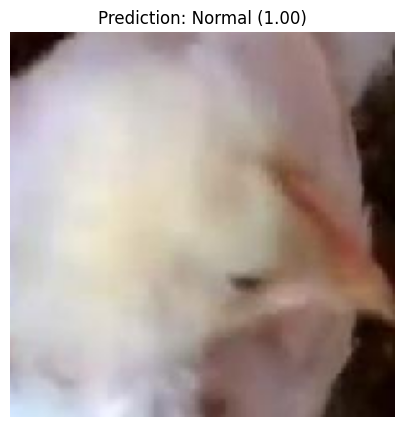

1/1 [==============================] - 0s 26ms/step


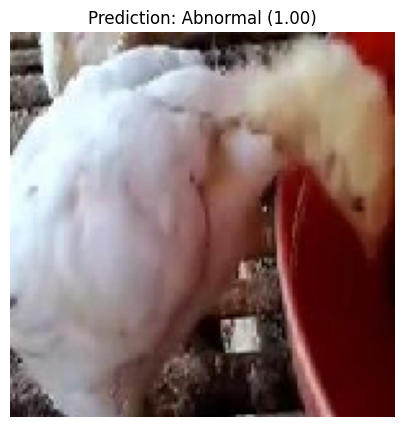

1/1 [==============================] - 0s 21ms/step


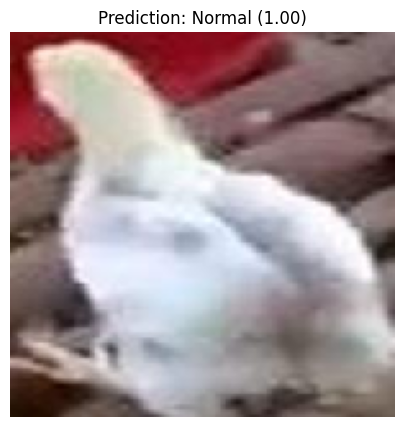

1/1 [==============================] - 0s 28ms/step


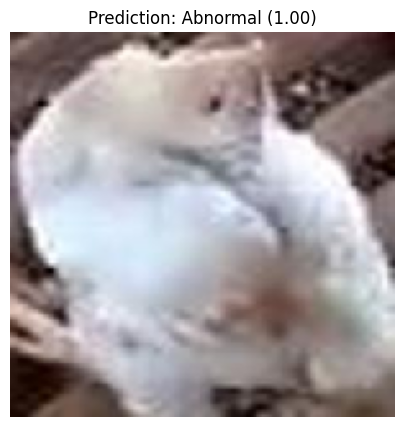

1/1 [==============================] - 0s 23ms/step


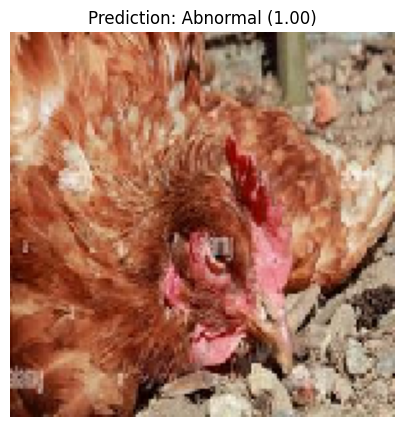

1/1 [==============================] - 0s 24ms/step


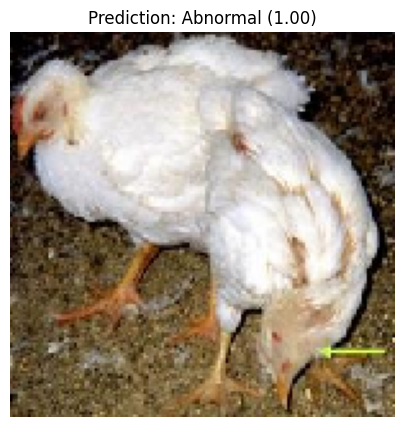

1/1 [==============================] - 0s 37ms/step


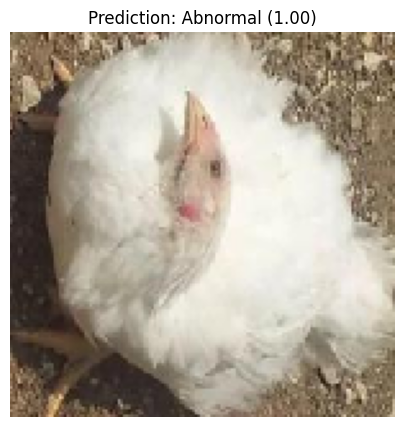

1/1 [==============================] - 0s 26ms/step


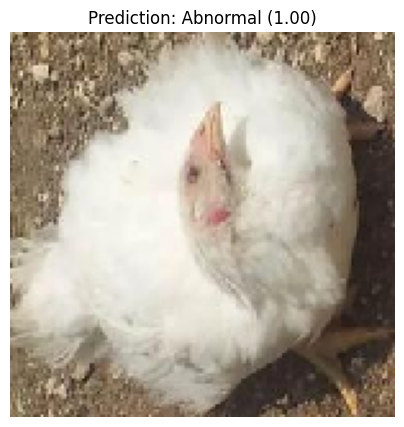

1/1 [==============================] - 0s 23ms/step


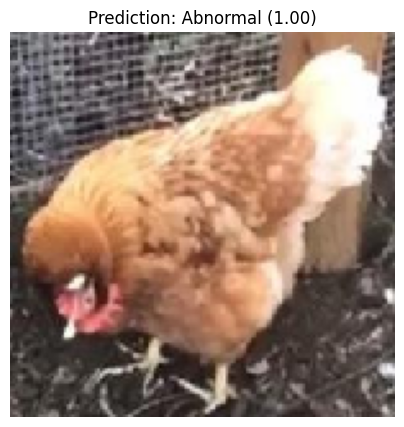

1/1 [==============================] - 0s 25ms/step


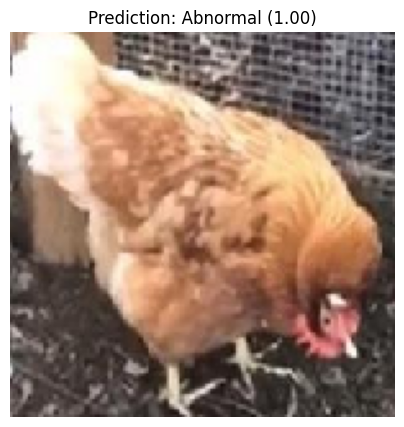

1/1 [==============================] - 0s 25ms/step


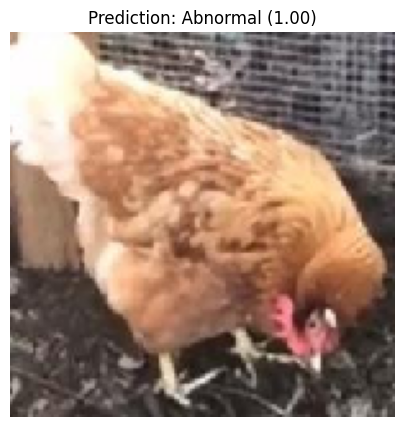

1/1 [==============================] - 0s 25ms/step


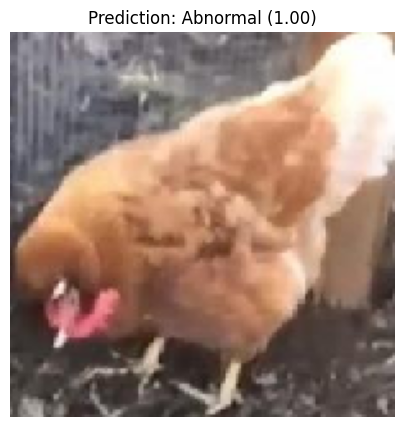

1/1 [==============================] - 0s 24ms/step


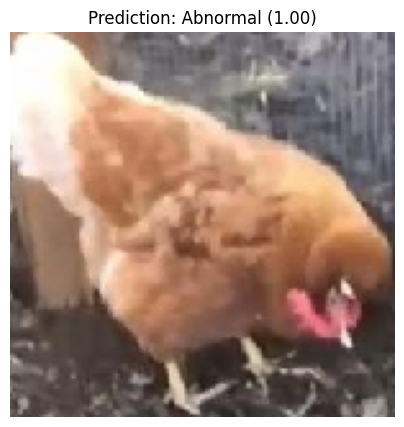

1/1 [==============================] - 0s 28ms/step


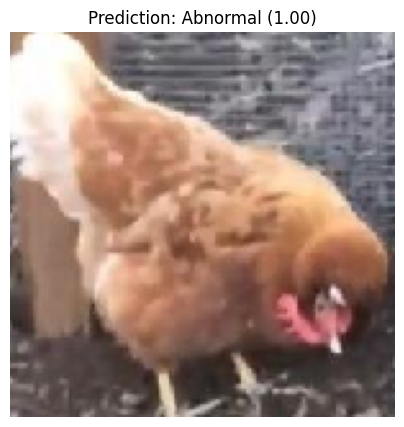

1/1 [==============================] - 0s 25ms/step


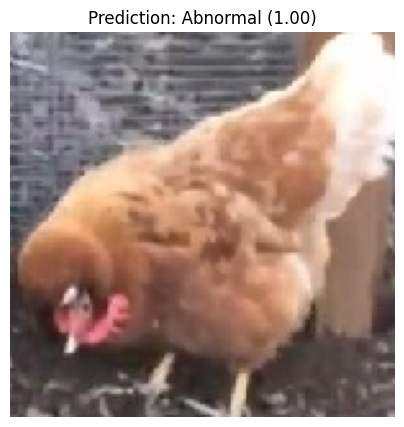

1/1 [==============================] - 0s 25ms/step


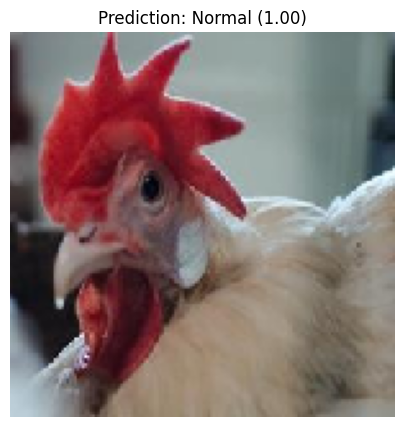

1/1 [==============================] - 0s 25ms/step


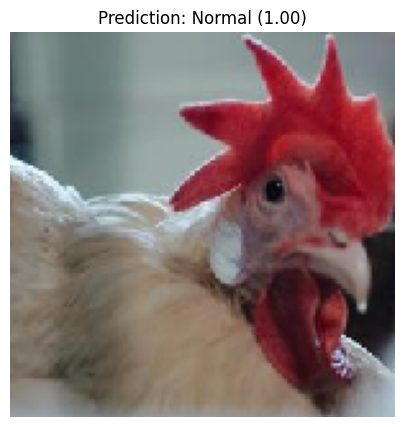

1/1 [==============================] - 0s 25ms/step


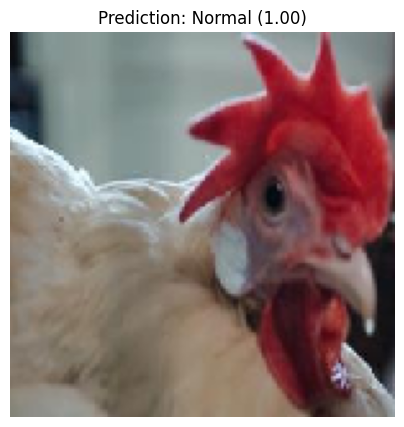

1/1 [==============================] - 0s 24ms/step


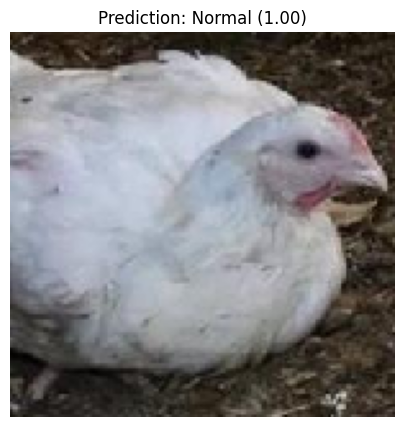

1/1 [==============================] - 0s 37ms/step


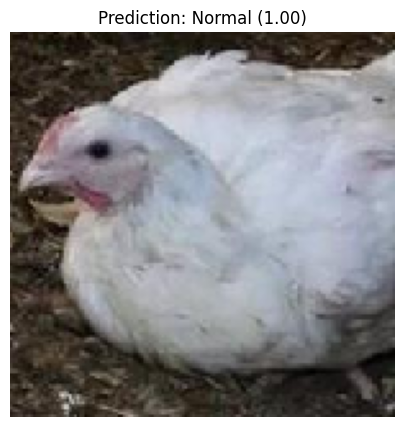

1/1 [==============================] - 0s 33ms/step


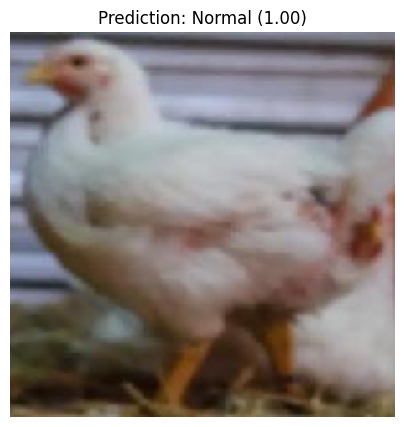

1/1 [==============================] - 0s 36ms/step


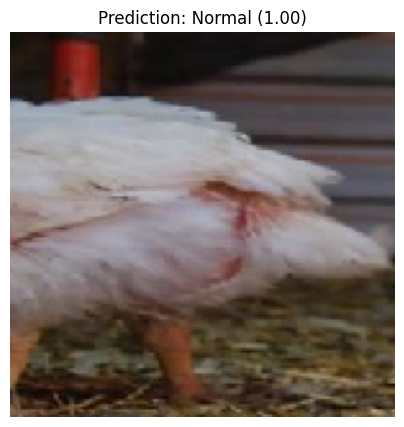

1/1 [==============================] - 0s 40ms/step


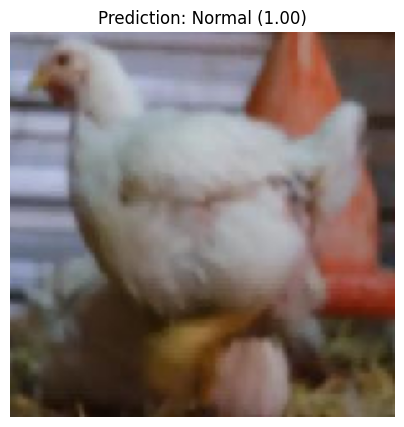

1/1 [==============================] - 0s 25ms/step


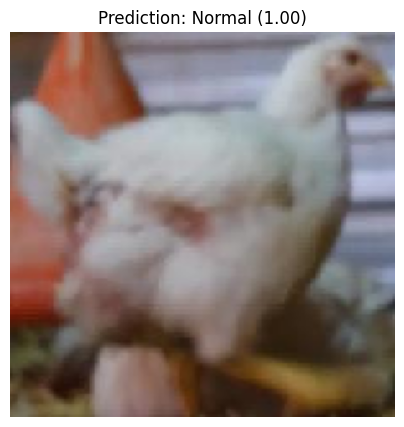

1/1 [==============================] - 0s 24ms/step


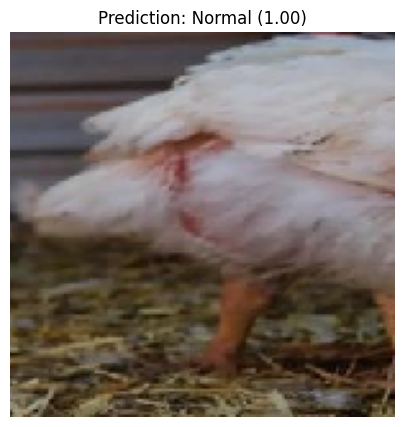

1/1 [==============================] - 0s 31ms/step


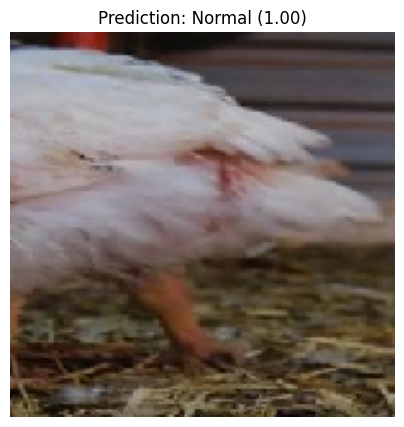

1/1 [==============================] - 0s 30ms/step


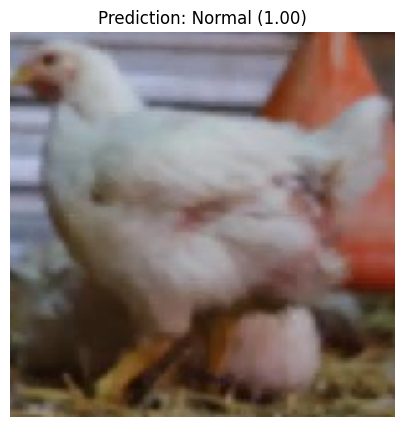

1/1 [==============================] - 0s 42ms/step


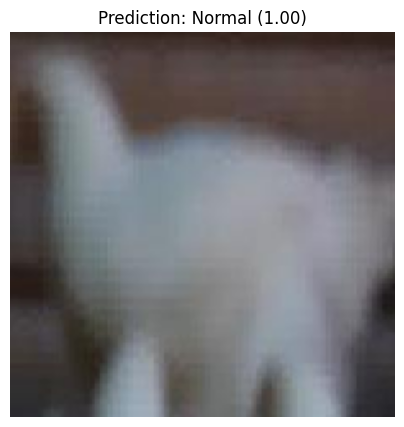

1/1 [==============================] - 0s 26ms/step


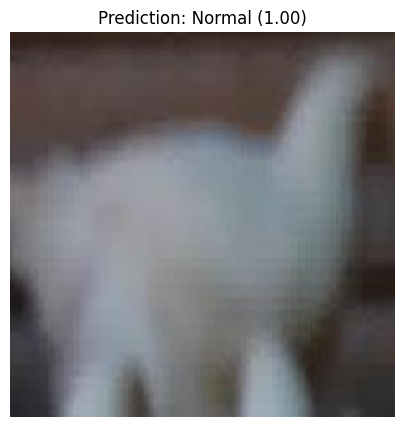

1/1 [==============================] - 0s 40ms/step


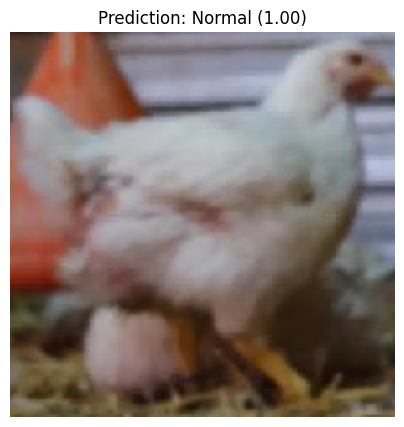

1/1 [==============================] - 0s 35ms/step


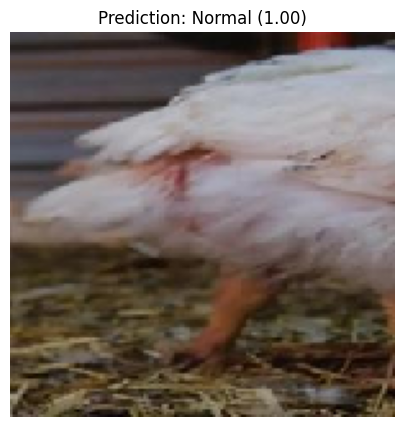

1/1 [==============================] - 0s 29ms/step


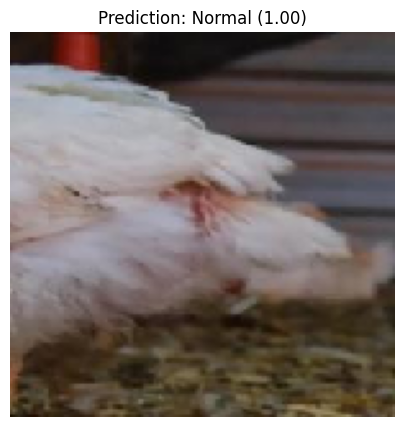

1/1 [==============================] - 0s 24ms/step


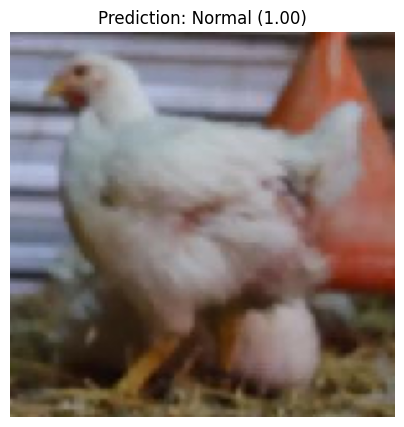

1/1 [==============================] - 0s 25ms/step


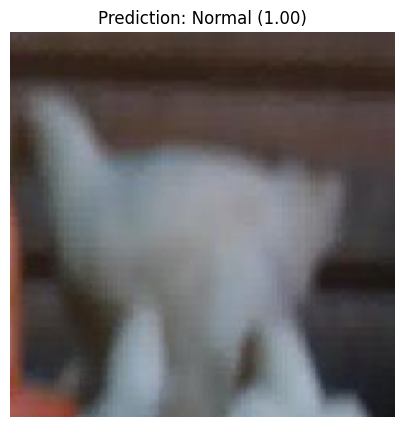

1/1 [==============================] - 0s 24ms/step


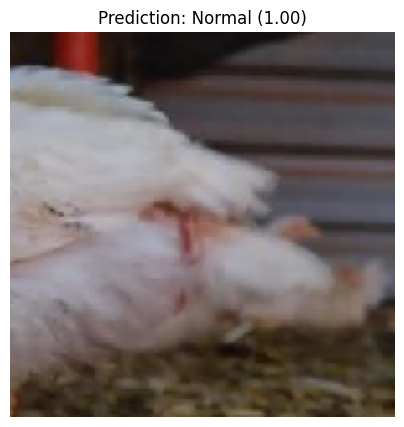

1/1 [==============================] - 0s 24ms/step


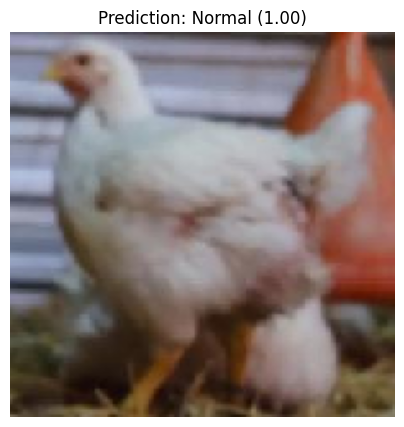

1/1 [==============================] - 0s 24ms/step


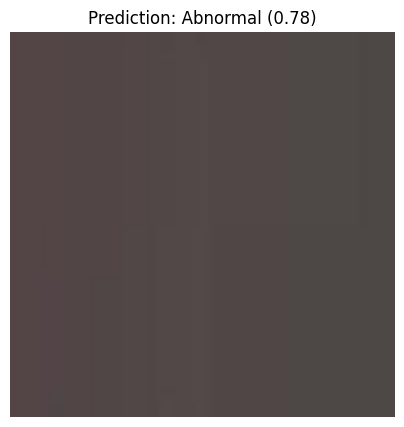

1/1 [==============================] - 0s 24ms/step


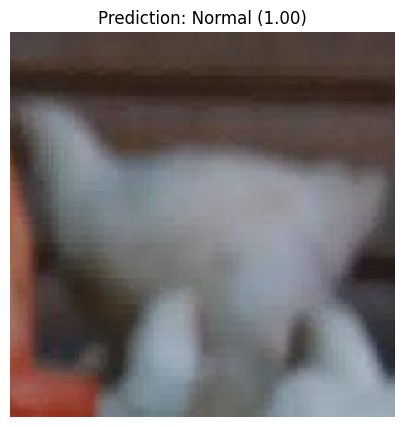

1/1 [==============================] - 0s 24ms/step


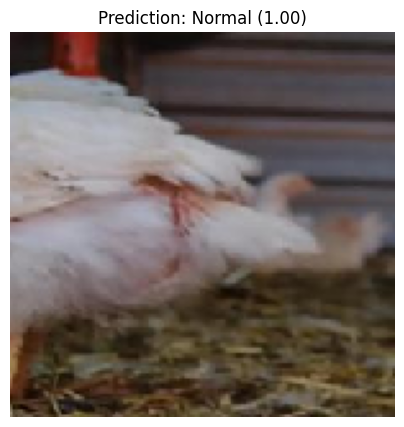

1/1 [==============================] - 0s 40ms/step


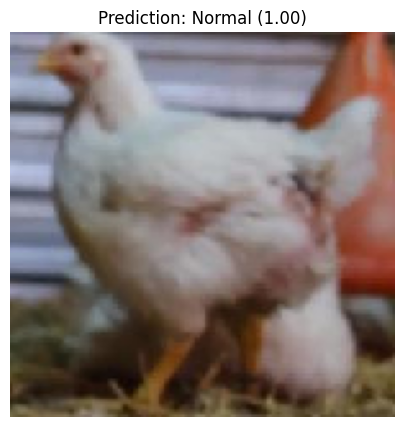

1/1 [==============================] - 0s 24ms/step


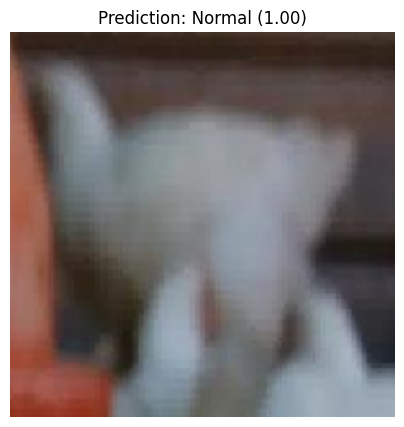

1/1 [==============================] - 0s 25ms/step


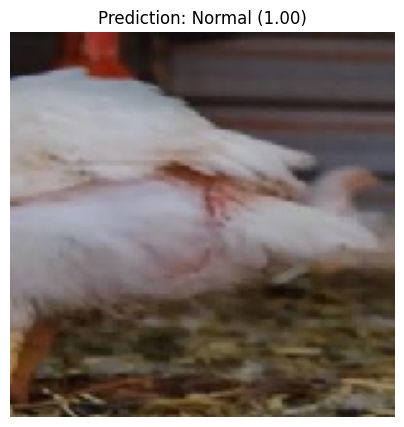

1/1 [==============================] - 0s 30ms/step


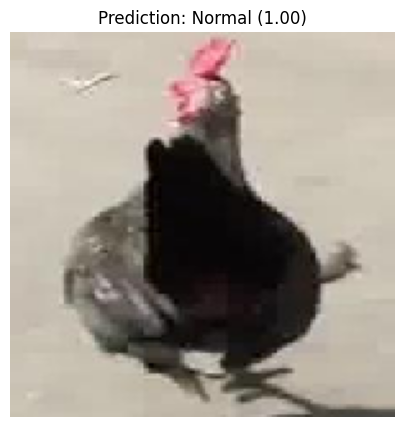

In [ ]:
# Cell 11: Predict on new images and display with prediction
for img_path in uploaded_images.keys():
    img, img_array = preprocess_image(img_path)
    prediction = model.predict(img_array)

    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.axis('off')

    if prediction[0][0] > 0.5:
        plt.title(f'Prediction: Normal ({prediction[0][0]:.2f})')
    else:
        plt.title(f'Prediction: Abnormal ({1 - prediction[0][0]:.2f})')

    plt.show()

